# Hi  Welcome to this competition


## import libery

In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport




import warnings
warnings.filterwarnings('ignore')

In [2]:
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor


from sklearn.metrics import mean_squared_error


# Import Date

In [3]:
train_df = pd.read_csv('/kaggle/input/30-days-of-ml/train.csv')

test_df = pd.read_csv('/kaggle/input/30-days-of-ml/test.csv')
sub = pd.read_csv('../input/30-days-of-ml/sample_submission.csv')

In [4]:
cat_features = [feature for feature in train_df.columns if 'cat' in feature]
cont_features = [feature for feature in train_df.columns if 'cont' in feature]

In [5]:
print('Rows and Columns in train dataset:', train_df.shape)
print('Rows and Columns in test dataset:', test_df.shape)

Rows and Columns in train dataset: (300000, 26)
Rows and Columns in test dataset: (200000, 25)


In [6]:
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,300000.0,250018.576947,144450.150010,1.000000,124772.500000,250002.500000,375226.500000,499999.000000
cont0,300000.0,0.527335,0.230599,-0.118039,0.405965,0.497053,0.668060,1.058443
cont1,300000.0,0.460926,0.214003,-0.069309,0.310494,0.427903,0.615113,0.887253
cont2,300000.0,0.490498,0.253346,-0.056104,0.300604,0.502462,0.647512,1.034704
cont3,300000.0,0.496689,0.219199,0.130676,0.329783,0.465026,0.664451,1.039560
cont4,300000.0,0.491654,0.240074,0.255908,0.284188,0.390470,0.696599,1.055424
cont5,300000.0,0.510526,0.228232,0.045915,0.354141,0.488865,0.669625,1.067649
cont6,300000.0,0.467476,0.210331,-0.224689,0.342873,0.429383,0.573383,1.111552
cont7,300000.0,0.537119,0.218140,0.203763,0.355825,0.504661,0.703441,1.032837
cont8,300000.0,0.498456,0.239920,-0.260275,0.332486,0.439151,0.606056,1.040229


In [7]:
test_df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,200000.0,249970.884580,144169.245904,0.000000,125316.750000,249997.000000,374649.750000,499995.000000
cont0,200000.0,0.526858,0.230506,-0.117993,0.405787,0.496602,0.666389,1.058434
cont1,200000.0,0.460882,0.213896,-0.069316,0.310536,0.427656,0.615041,0.887253
cont2,200000.0,0.491686,0.252852,-0.056095,0.302189,0.503075,0.648234,1.034687
cont3,200000.0,0.496263,0.219304,0.130655,0.328865,0.464590,0.663401,1.039558
cont4,200000.0,0.492200,0.240251,0.255903,0.284188,0.395080,0.697252,1.055423
cont5,200000.0,0.509944,0.228100,0.045921,0.353682,0.488378,0.668586,1.067641
cont6,200000.0,0.468050,0.210167,-0.224613,0.342813,0.429819,0.573861,1.111540
cont7,200000.0,0.537617,0.218197,0.203763,0.356482,0.505216,0.703289,1.032823
cont8,200000.0,0.497587,0.239337,-0.260236,0.332762,0.438716,0.605368,1.040208


In [8]:
train_df.drop("id", axis=1, inplace=True)
test_df.drop("id", axis=1, inplace=True)


# EDA

In [9]:
report = ProfileReport(train_df)
report

Summarize dataset:   0%|          | 0/38 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

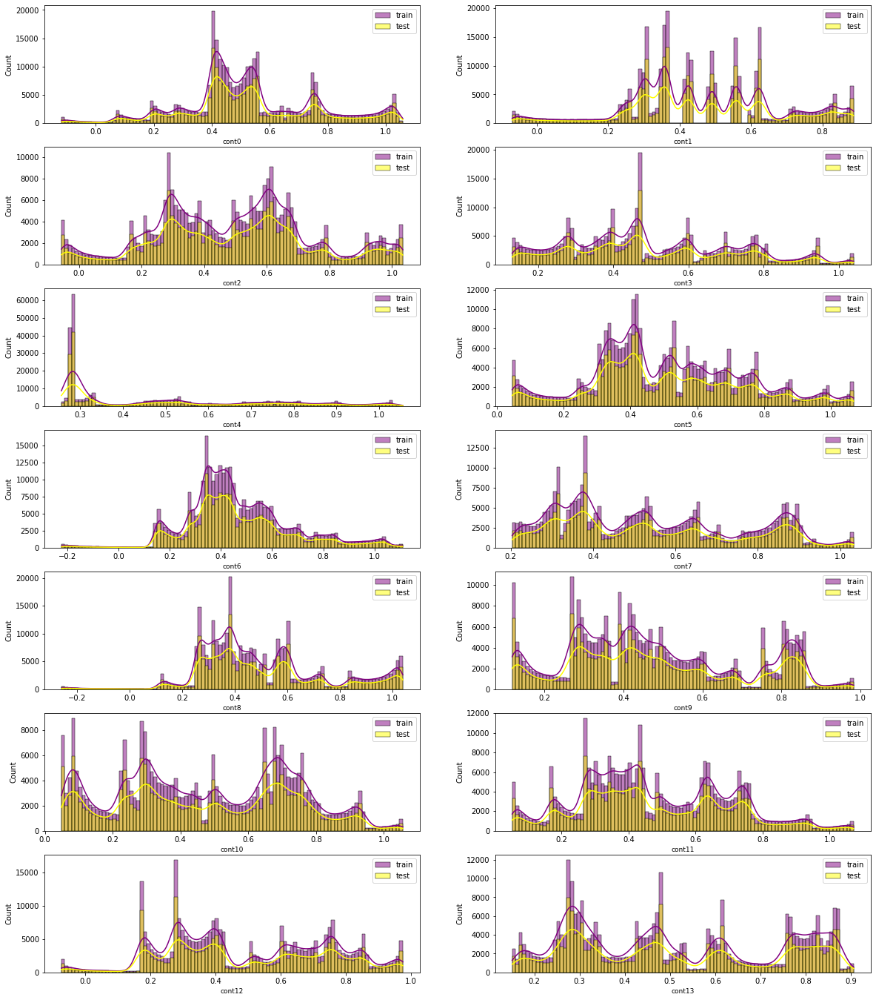

In [10]:
# Numerical features distribution 
i = 1
plt.figure()
fig, ax = plt.subplots(7, 2,figsize=(20, 24))
for feature in cont_features:
    plt.subplot(7, 2,i)
    sns.histplot(train_df[feature],color="purple", kde=True,bins=100, label='train')
    sns.histplot(test_df[feature],color="yellow", kde=True,bins=100, label='test')
    plt.xlabel(feature, fontsize=9); 
    plt.legend()
    i += 1


<Figure size 432x288 with 0 Axes>

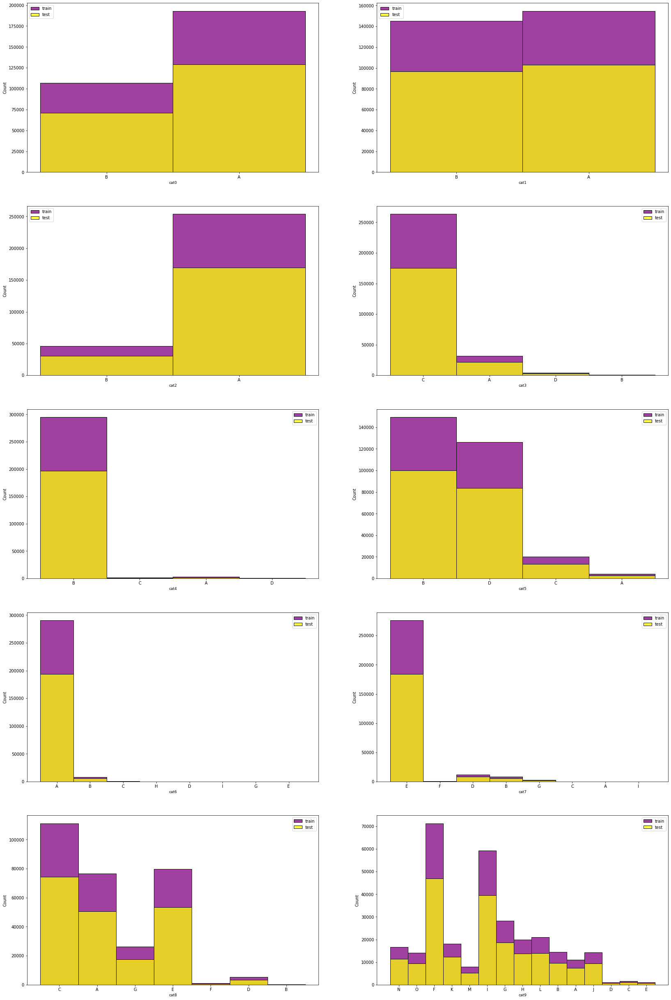

In [11]:
# Categorical features distribution 
i = 1
plt.figure()
fig, ax = plt.subplots(5, 2,figsize=(28, 44))
for feature in cat_features:
    plt.subplot(5, 2,i)
    sns.histplot(train_df[feature],color="purple", label='train')
    sns.histplot(test_df[feature],color="yellow", label='test')
    plt.xlabel(feature, fontsize=9); 
    plt.legend()
    i += 1

In [12]:
corr = train_df[cont_features+['target']].corr()
corr.style.background_gradient(cmap='hsv').set_precision(2)


,cont0,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,target
cont0,1.00,-0.01,-0.30,0.21,-0.11,0.39,0.13,0.29,0.39,0.39,0.36,0.26,0.42,0.02,0.03
cont1,-0.01,1.00,-0.00,-0.00,-0.00,0.00,0.00,0.01,-0.02,-0.00,-0.00,-0.02,-0.01,-0.01,-0.00
cont2,-0.30,-0.00,1.00,-0.18,0.09,-0.30,-0.14,-0.28,-0.33,-0.31,-0.30,-0.33,-0.35,-0.04,0.03
cont3,0.21,-0.00,-0.18,1.00,-0.07,0.20,0.04,0.17,0.19,0.19,0.20,0.14,0.26,0.04,-0.02
cont4,-0.11,-0.00,0.09,-0.07,1.00,-0.15,-0.04,-0.10,-0.12,-0.12,-0.13,-0.12,-0.15,-0.01,-0.02
cont5,0.39,0.00,-0.30,0.20,-0.15,1.00,0.21,0.33,0.39,0.41,0.40,0.31,0.47,0.05,-0.02
cont6,0.13,0.00,-0.14,0.04,-0.04,0.21,1.00,0.14,0.12,0.19,0.18,0.17,0.17,0.03,-0.01
cont7,0.29,0.01,-0.28,0.17,-0.10,0.33,0.14,1.00,0.33,0.32,0.28,0.28,0.36,0.06,0.04
cont8,0.39,-0.02,-0.33,0.19,-0.12,0.39,0.12,0.33,1.00,0.41,0.34,0.30,0.43,0.05,0.02
cont9,0.39,-0.00,-0.31,0.19,-0.12,0.41,0.19,0.32,0.41,1.00,0.36,0.33,0.44,0.04,-0.02


# Pre Processing

In [13]:
# missing value
print('Missing values in train dataset:', sum(train_df.isnull().mean()*100))
print('Missing values in test dataset:', sum(test_df.isnull().mean()*100))

Missing values in train dataset: 0.0
Missing values in test dataset: 0.0


In [14]:
# duplicates data
train_df.drop_duplicates()
train_df.shape

(300000, 25)

In [15]:
x = train_df.drop(['target'], axis=1)
y = train_df['target']
X_test = test_df.copy()

# Preparation for Model

In [16]:
# data encoding
from sklearn.preprocessing import OrdinalEncoder

ordinal_encoder = OrdinalEncoder()
x[cat_features] = ordinal_encoder.fit_transform(x[cat_features])
X_test[cat_features] = ordinal_encoder.transform(X_test[cat_features])
x.head()

,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13
0,1.0,1.0,1.0,2.0,1.0,1.0,0.0,4.0,2.0,13.0,...,0.610706,0.400361,0.160266,0.310921,0.389470,0.267559,0.237281,0.377873,0.322401,0.869850
1,1.0,1.0,0.0,0.0,1.0,3.0,0.0,5.0,0.0,14.0,...,0.276853,0.533087,0.558922,0.516294,0.594928,0.341439,0.906013,0.921701,0.261975,0.465083
2,0.0,0.0,0.0,2.0,1.0,3.0,0.0,3.0,0.0,5.0,...,0.285074,0.650609,0.375348,0.902567,0.555205,0.843531,0.748809,0.620126,0.541474,0.763846
3,1.0,1.0,0.0,2.0,1.0,3.0,0.0,4.0,2.0,10.0,...,0.284667,0.668980,0.239061,0.732948,0.679618,0.574844,0.346010,0.714610,0.540150,0.280682
4,0.0,0.0,0.0,2.0,1.0,3.0,0.0,4.0,0.0,13.0,...,0.287595,0.686964,0.420667,0.648182,0.684501,0.956692,1.000773,0.776742,0.625849,0.250823


In [17]:
# trai test split
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(x, y,test_size=0.2, random_state=22)


# Create Model


## Random forest 

In [18]:

model_rf = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=30,
           max_features='sqrt', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=2, min_samples_split=5,
           min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=1,
           oob_score=False, random_state=22, verbose=0, warm_start=False)

model_rf.fit(X_train, y_train)
pred_Rand = model_rf.predict(X_valid)
print(mean_squared_error(y_valid, pred_Rand, squared=False))


0.7304932464640103


## Xgboost

In [19]:
xgb_params = {'objective': 'reg:squarederror',
              'n_estimators': 10000,
              'learning_rate': 0.036,
              'subsample': 0.926,
              'colsample_bytree': 0.118,
              'grow_policy':'lossguide',
              'max_depth': 3,
              'booster': 'gbtree', 
              'reg_lambda': 45.1,
              'reg_alpha': 34.9,
              'random_state': 42,
              'reg_lambda': 0.00087,
              'reg_alpha': 23.132}

model_XGB = XGBRegressor(**xgb_params)
model_XGB.fit(X_train, y_train) 
pred_XGB = model_XGB.predict(X_valid)
print(mean_squared_error(y_valid, pred_XGB, squared=False))

0.7136153607672061


# Submit to the competition

In [20]:
pred = model_XGB.predict(X_test)

# Save the predictions to a CSV file
sub['target']=pred
sub.to_csv('submission.csv', index=False)

In [21]:
sub

,id,target
0,0,8.036820
1,5,8.404529
2,15,8.427405
3,16,8.451090
4,17,8.057931
...,...,...
199995,499987,8.024939
199996,499990,8.520566
199997,499991,8.621932
199998,499994,8.241227
